In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 21.3 MB/s eta 0:00:00


In [ ]:
!pip install easyocr

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 77.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 15.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.2/978.2 kB 75.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.6/300.6 kB 31.9 MB/s eta 0:00:00


In [ ]:
!pip install pytesseract

In [ ]:
import os
import cv2
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from glob import glob
from xml.dom import minidom
import random
import easyocr
from ultralytics import YOLO
import yaml
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import torch
import pytesseract
from PIL import Image

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [ ]:
!ls "/content/drive/MyDrive/Major Project cdac/annotations"

Cars0.xml    Cars166.xml  Cars231.xml  Cars298.xml  Cars363.xml  Cars429.xml
Cars100.xml  Cars167.xml  Cars232.xml  Cars299.xml  Cars364.xml  Cars42.xml
Cars101.xml  Cars168.xml  Cars233.xml  Cars29.xml   Cars365.xml  Cars430.xml
Cars102.xml  Cars169.xml  Cars234.xml  Cars2.xml    Cars366.xml  Cars431.xml
Cars103.xml  Cars16.xml   Cars235.xml  Cars300.xml  Cars367.xml  Cars432.xml
Cars104.xml  Cars170.xml  Cars236.xml  Cars301.xml  Cars368.xml  Cars43.xml
Cars105.xml  Cars171.xml  Cars237.xml  Cars302.xml  Cars369.xml  Cars44.xml
Cars106.xml  Cars172.xml  Cars238.xml  Cars303.xml  Cars36.xml	 Cars45.xml
Cars107.xml  Cars173.xml  Cars239.xml  Cars304.xml  Cars370.xml  Cars46.xml
Cars108.xml  Cars174.xml  Cars23.xml   Cars305.xml  Cars371.xml  Cars47.xml
Cars109.xml  Cars175.xml  Cars240.xml  Cars306.xml  Cars372.xml  Cars48.xml
Cars10.xml   Cars176.xml  Cars241.xml  Cars307.xml  Cars373.xml  Cars49.xml
Cars110.xml  Cars177.xml  Cars242.xml  Cars308.xml  Cars374.xml  Cars4.xml
Cars111.xm

In [ ]:
# -*- coding: utf-8 -*-

import os
from glob import glob
from xml.dom import minidom

# =========================
# CLASS LOOKUP TABLE
# =========================
lut = {}
lut["accessory"] = 0
lut["top"]       = 1
lut["bottom"]    = 2
lut["bag"]       = 3
lut["shoes"]     = 4


# =========================
# COORDINATE CONVERSION
# =========================
def convert_coordinates(size, box):
    dw = 1.0 / size[0]
    dh = 1.0 / size[1]

    x = (box[0] + box[1]) / 2.0
    y = (box[2] + box[3]) / 2.0
    w = box[1] - box[0]
    h = box[3] - box[2]

    x = x * dw
    w = w * dw
    y = y * dh
    h = h * dh

    return (x, y, w, h)


# =========================
# XML  ->  YOLO
# =========================
def convert_xml2yolo(lut, input_path, output_path):

    # safely create output directory (including parents)
    os.makedirs(output_path, exist_ok=True)

    xml_files = glob(f"{input_path}/*.xml")
    print(f"Found {len(xml_files)} XML files")

    for fname in xml_files:

        xmldoc = minidom.parse(fname)
        annot_fname = os.path.splitext(os.path.basename(fname))[0]
        fname_out = os.path.join(output_path, annot_fname + ".txt")

        with open(fname_out, "w") as f:

            itemlist = xmldoc.getElementsByTagName('object')
            size = xmldoc.getElementsByTagName('size')[0]

            width = int(size.getElementsByTagName('width')[0].firstChild.data)
            height = int(size.getElementsByTagName('height')[0].firstChild.data)

            for item in itemlist:

                # class label
                classid = item.getElementsByTagName('name')[0].firstChild.data.strip()

                if classid in lut:
                    label_str = str(lut[classid])
                else:
                    label_str = "0"   # default fallback

                # bounding box
                xmin = float(item.getElementsByTagName('bndbox')[0].getElementsByTagName('xmin')[0].firstChild.data)
                xmax = float(item.getElementsByTagName('bndbox')[0].getElementsByTagName('xmax')[0].firstChild.data)
                ymin = float(item.getElementsByTagName('bndbox')[0].getElementsByTagName('ymin')[0].firstChild.data)
                ymax = float(item.getElementsByTagName('bndbox')[0].getElementsByTagName('ymax')[0].firstChild.data)

                b = (xmin, xmax, ymin, ymax)
                bb = convert_coordinates((width, height), b)

                f.write(label_str + " " + " ".join([("%.6f" % a) for a in bb]) + "\n")

    print("✅ Converting is finished!")


# =========================
# RUN CONVERSION
# =========================

convert_xml2yolo(
    lut,
    input_path = "/content/drive/MyDrive/Major Project cdac/annotations",
    output_path = "/content/drive/MyDrive/zenodo-license/output/annotations"
)

Found 433 XML files
✅ Converting is finished!


In [ ]:
def create_directories_if_not_exist(directories: list):
    # Assert: Is the parameter a list?
    assert isinstance(directories, list), "The parameter must be a list (array)."

    # Assert: Is every element in the list a string?
    for dir_path in directories:
        assert isinstance(dir_path, str), f"The element '{dir_path}' in the list is not a string."

    # Create directories
    for dir_path in directories:
        if not os.path.exists(dir_path):
            os.mkdir(dir_path)
            print(f"Created: {dir_path}")
        else:
            print(f"Already exists: {dir_path}")

In [ ]:
import os

# -----------------------------
# Function to safely create dirs
# -----------------------------
def create_directories_if_not_exist(dirs):
    for d in dirs:
        os.makedirs(d, exist_ok=True)
    print("✅ All directories are ready.")


# -----------------------------
# Your dataset structure
# -----------------------------
directories = [
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train",
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/val",
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/labels/train",
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/labels/val"
]

create_directories_if_not_exist(directories)

✅ All directories are ready.


In [ ]:
import os
import shutil
import random


def split_images_and_labels(
        val_size = 0.1,
        input_dir = "/content/drive/MyDrive/Major Project cdac/images",   # ONLY images folder
        labels_dir = "/content/drive/MyDrive/zenodo-license/output/annotations",
        output_dir = "/content/drive/MyDrive/zenodo-license/license_plate/dataset"):

    # ----------------------------
    # Create required directories
    # ----------------------------
    for p in [
        os.path.join(output_dir, "images/train"),
        os.path.join(output_dir, "images/val"),
        os.path.join(output_dir, "labels/train"),
        os.path.join(output_dir, "labels/val")
    ]:
        os.makedirs(p, exist_ok=True)

    # ----------------------------
    # Read all image filenames
    # ----------------------------
    all_images = [
        f for f in os.listdir(input_dir)
        if f.lower().endswith((".jpg", ".jpeg", ".png"))
    ]

    if not all_images:
        raise FileNotFoundError(f"❌ No images found in: {input_dir}")

    random.shuffle(all_images)

    split_idx = int(len(all_images) * (1 - val_size))

    train_imgs = all_images[:split_idx]
    val_imgs   = all_images[split_idx:]


    def copy_split(img_list, split_name):
        for img in img_list:

            # ---------- IMAGE ----------
            src_img = os.path.join(input_dir, img)
            dst_img = os.path.join(output_dir, "images", split_name, img)

            shutil.copy2(src_img, dst_img)

            # ---------- LABEL ----------
            label = os.path.splitext(img)[0] + ".txt"
            src_label = os.path.join(labels_dir, label)
            dst_label = os.path.join(output_dir, "labels", split_name, label)

            if os.path.exists(src_label):
                shutil.copy2(src_label, dst_label)
            else:
                print(f"⚠️  Warning — label missing for: {img}")


    copy_split(train_imgs, "train")
    copy_split(val_imgs, "val")

    print(f"✅ Splitting finished! {len(train_imgs)} train | {len(val_imgs)} val")


# RUN IT
split_images_and_labels()

✅ Splitting finished! 389 train | 44 val


In [ ]:
import yaml

data = {
    'path': '/content/drive/MyDrive/zenodo-license/license_plate/dataset',
    'train': 'images/train',
    'val': 'images/val',
    'names': [
        "number_plate"
    ]
}

yaml_path = '/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml'

with open(yaml_path, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

print(f"✅ Data has been written to: {yaml_path}")

✅ Data has been written to: /content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml


Training Wala

In [ ]:
from ultralytics import YOLO

model = YOLO("yolo11s.pt")   # or yolo12s.pt

model.train(
    data="/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml",
    epochs=1,
    imgsz=640,
    batch=32
)

Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=1, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=

ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x792553153bf0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

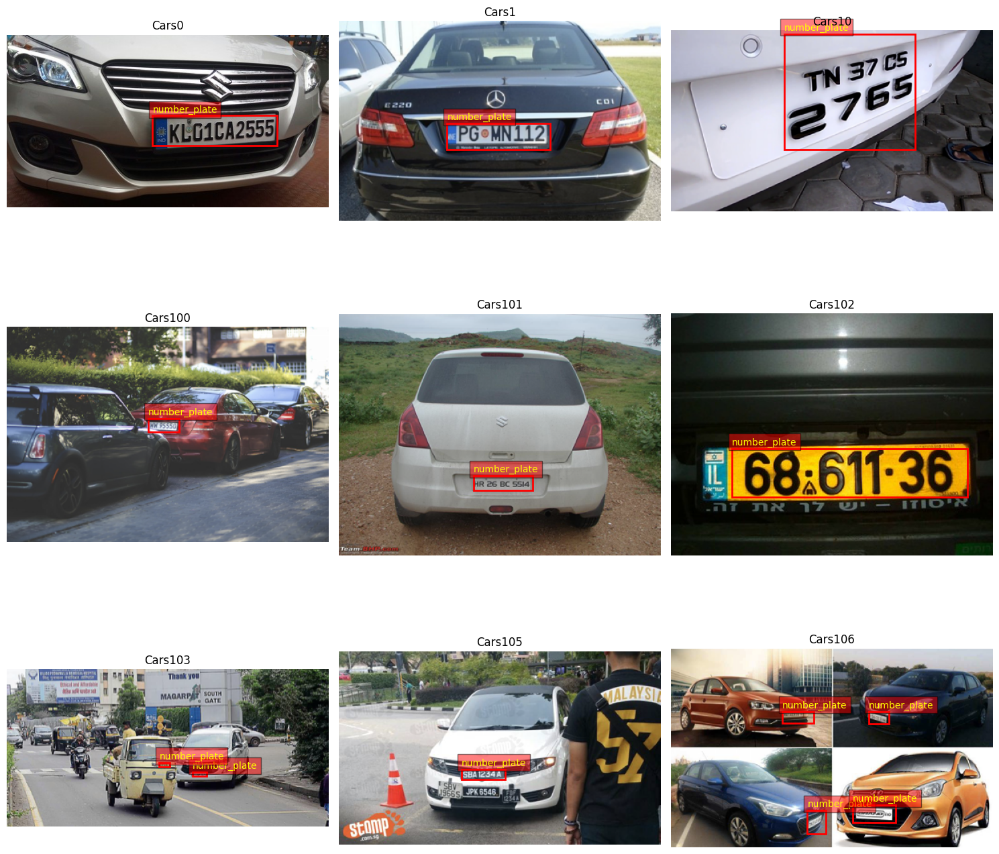

In [ ]:
import os
import cv2
import glob
import matplotlib.pyplot as plt
import matplotlib.patches as patches

# =========================
# PATHS
# =========================
image_dir = "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train"
label_dir = "/content/drive/MyDrive/zenodo-license/license_plate/dataset/labels/train"

# class names (optional)
names = ["number_plate"]

# =========================
# LOAD IMAGE PATHS
# =========================
image_extensions = ("*.jpg", "*.jpeg", "*.png")

image_paths = []
for ext in image_extensions:
    image_paths.extend(glob.glob(os.path.join(image_dir, ext)))

image_paths = sorted(image_paths)

if len(image_paths) == 0:
    raise FileNotFoundError(f"❌ No images found in: {image_dir}")

# use up to 9 images max
image_paths = image_paths[:9]

# =========================
# PLOT
# =========================
cols = 3
rows = int((len(image_paths) + cols - 1) / cols)

fig, axes = plt.subplots(rows, cols, figsize=(15, 15))
axes = axes.flatten()

for ax in axes:
    ax.axis("off")

for idx, image_path in enumerate(image_paths):

    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w, _ = img.shape

    base_name = os.path.splitext(os.path.basename(image_path))[0]
    label_path = os.path.join(label_dir, base_name + ".txt")

    ax = axes[idx]
    ax.imshow(img)
    ax.set_title(base_name)
    ax.axis("off")

    # =========================
    # DRAW BOXES IF LABEL EXISTS
    # =========================
    if os.path.exists(label_path):
        with open(label_path, "r") as f:
            for line in f:
                values = list(map(float, line.strip().split()))
                class_id, x_center, y_center, box_w, box_h = values

                # Convert YOLO -> pixel coords
                x1 = int((x_center - box_w / 2) * w)
                y1 = int((y_center - box_h / 2) * h)
                x2 = int((x_center + box_w / 2) * w)
                y2 = int((y_center + box_h / 2) * h)

                rect = patches.Rectangle(
                    (x1, y1),
                    x2 - x1,
                    y2 - y1,
                    linewidth=2,
                    edgecolor='red',
                    facecolor='none'
                )
                ax.add_patch(rect)

                # optional class text
                if int(class_id) < len(names):
                    ax.text(
                        x1,
                        y1 - 5,
                        names[int(class_id)],
                        color="yellow",
                        fontsize=10,
                        bbox=dict(facecolor="red", alpha=0.5)
                    )
    else:
        ax.text(5, 15, "NO LABEL", color="red", fontsize=12)

plt.tight_layout()
plt.show()

In [ ]:
import torch
from ultralytics import YOLO

# ----- GPU SETUP -----
gpu_count = torch.cuda.device_count()

if gpu_count > 1:
    device = ",".join(str(i) for i in range(gpu_count))   # e.g. "0,1"
elif gpu_count == 1:
    device = 0
else:
    device = "cpu"

print(f"🟢 Using device: {device}")

# ----- LOAD MODEL -----
model = YOLO("yolo12s.pt")   # or yolo11s.pt / yolo11n.pt

# ----- TRAIN -----
results = model.train(
    data="/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml",
    epochs=100,         # allow learning time
    imgsz=640,
    batch=32,
    workers=2,
    device=device,
    patience=20         # stop when no improvement
)

🟢 Using device: 0
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train3, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

In [ ]:
import torch
from ultralytics import YOLO

# ----- GPU SETUP -----
gpu_count = torch.cuda.device_count()

if gpu_count > 1:
    device = ",".join(str(i) for i in range(gpu_count))   # e.g. "0,1"
elif gpu_count == 1:
    device = 0
else:
    device = "cpu"

print(f"🟢 Using device: {device}")

# ----- LOAD YOLOv8-S MODEL -----
model = YOLO("yolov8s.pt")   # <<== YOLOv8 small model

# ----- TRAIN -----
results = model.train(
    data="/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml",
    epochs=100,          # allow learning time
    imgsz=640,
    batch=32,            # reduce to 16/8 if you get OOM
    workers=2,
    device=device,
    patience=20          # early stop if no improvement
)

🟢 Using device: 0
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8s.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train4, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_ma

In [ ]:
import torch
from ultralytics import YOLO

# ----- GPU SETUP -----
gpu_count = torch.cuda.device_count()

if gpu_count > 1:
    device = ",".join(str(i) for i in range(gpu_count))   # e.g. "0,1"
elif gpu_count == 1:
    device = 0
else:
    device = "cpu"

print(f"🟢 Using device: {device}")

# ----- LOAD YOLOv8-S MODEL -----
model = YOLO("yolov8m.pt")   # <<== YOLOv8 medium model

# ----- TRAIN -----
results = model.train(
    data="/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml",
    epochs=100,          # allow learning time
    imgsz=960,
    batch=16,            # reduce to 16/8 if you get OOM
    workers=2,
    device=0,
    patience=30,          # early stop if no improvement
    augment=True
)

🟢 Using device: 0
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8m.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mas

In [ ]:
import torch
from ultralytics import YOLO

# ----- GPU SETUP -----
gpu_count = torch.cuda.device_count()

if gpu_count > 1:
    device = ",".join(str(i) for i in range(gpu_count))   # e.g. "0,1"
elif gpu_count == 1:
    device = 0
else:
    device = "cpu"

print(f"🟢 Using device: {device}")

# ----- LOAD YOLOv8-S MODEL -----
model = YOLO("yolov8n.pt")   # <<== YOLOv8 nano model

# ----- TRAIN -----
results = model.train(
    data="/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml",
    epochs=100,          # allow learning time
    imgsz=960,
    batch=16,            # reduce to 16/8 if you get OOM
    workers=2,
    device=0,
    patience=30,          # early stop if no improvement
    augment=True
)

🟢 Using device: 0
Ultralytics 8.3.241 🚀 Python-3.12.12 torch-2.9.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=960, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mas

In [ ]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.8 MB/s eta 0:00:00


In [ ]:
from ultralytics import YOLO

print("Training on CPU ⚙️")

model = YOLO("yolo11n.pt")   # or yolov8n.pt

results = model.train(
    data="/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml",
    epochs=50,        # reduce for CPU
    imgsz=640,        # reduce for CPU
    batch=8,          # reduce for CPU
    workers=2,
    device="cpu",     # <<--- IMPORTANT
    patience=20,
    augment=True
)

Training on CPU ⚙️
Ultralytics 8.3.242 🚀 Python-3.12.12 torch-2.9.0+cpu CPU (Intel Xeon CPU @ 2.20GHz)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/content/drive/MyDrive/zenodo-license/license_plate/dataset/data.yaml, degrees=0.0, deterministic=True, device=cpu, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=50, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train6, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_m

In [4]:
import cv2
import os
import numpy as np
from ultralytics import YOLO

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [9]:
IMAGE_DIR = "/content/drive/MyDrive/Major Project cdac/images"     # change if using Drive
CROP_DIR = "/content/drive/MyDrive/zenodo-license/crops"
VIS_DIR = "/content/drive/MyDrive/zenodo-license/visualized"
CONF_THRESHOLD = 0.4

os.makedirs(CROP_DIR, exist_ok=True)
os.makedirs(VIS_DIR, exist_ok=True)

In [10]:
model = YOLO("/content/drive/MyDrive/output/best.pt")

In [11]:
def preprocess_plate(plate_img):
    gray = cv2.cvtColor(plate_img, cv2.COLOR_BGR2GRAY)

    gray = cv2.resize(
        gray, None,
        fx=2, fy=2,
        interpolation=cv2.INTER_CUBIC
    )

    thresh = cv2.adaptiveThreshold(
        gray,
        255,
        cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
        cv2.THRESH_BINARY,
        11,
        2
    )

    if thresh.mean() < 127:
        thresh = cv2.bitwise_not(thresh)

    return thresh

In [12]:
for img_name in os.listdir(IMAGE_DIR):

    if not img_name.lower().endswith((".jpg", ".png", ".jpeg")):
        continue

    img_path = os.path.join(IMAGE_DIR, img_name)
    image = cv2.imread(img_path)

    if image is None:
        continue

    # Run YOLO detection
    results = model(image)

    # -----------------------------
    # PROCESS YOLO DETECTIONS (inside image loop!)
    # -----------------------------
    for i, box in enumerate(results[0].boxes):

        # Get confidence of detection
        conf = float(box.conf[0])
        if conf < CONF_THRESHOLD:
            continue  # skip low-confidence boxes

        # Get bounding box coordinates
        x1, y1, x2, y2 = map(int, box.xyxy[0])

        # Crop the detected plate
        plate_crop = image[y1:y2, x1:x2]
        if plate_crop.size == 0:
            continue  # skip empty crops

        # Preprocess plate
        processed_plate = preprocess_plate(plate_crop)

        # Save cropped plate
        crop_name = f"{os.path.splitext(img_name)[0]}_plate_{i}.png"
        cv2.imwrite(os.path.join(CROP_DIR, crop_name), processed_plate)

        # Draw bounding box
        cv2.rectangle(image, (x1, y1), (x2, y2), (0, 255, 0), 2)
        cv2.putText(image, f"plate {conf:.2f}", (x1, y1 - 5),
                    cv2.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

    # Save visualized image
    cv2.imwrite(os.path.join(VIS_DIR, img_name), image)


0: 416x640 7 number_plates, 525.6ms
Speed: 16.0ms preprocess, 525.6ms inference, 41.0ms postprocess per image at shape (1, 3, 416, 640)

0: 384x640 1 number_plate, 335.0ms
Speed: 3.9ms preprocess, 335.0ms inference, 0.8ms postprocess per image at shape (1, 3, 384, 640)

0: 448x640 4 number_plates, 372.6ms
Speed: 3.5ms preprocess, 372.6ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

0: 416x640 1 number_plate, 345.4ms
Speed: 3.8ms preprocess, 345.4ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 384x640 1 number_plate, 577.0ms
Speed: 5.0ms preprocess, 577.0ms inference, 1.0ms postprocess per image at shape (1, 3, 384, 640)

0: 512x640 1 number_plate, 462.5ms
Speed: 4.1ms preprocess, 462.5ms inference, 0.8ms postprocess per image at shape (1, 3, 512, 640)

0: 416x640 1 number_plate, 311.6ms
Speed: 3.2ms preprocess, 311.6ms inference, 0.7ms postprocess per image at shape (1, 3, 416, 640)

0: 480x640 1 number_plate, 404.3ms
Speed: 3.5ms preproces

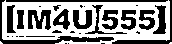

In [24]:
from IPython.display import Image, display
import os

sample = os.listdir(CROP_DIR)[275]
display(Image(filename=os.path.join(CROP_DIR, sample), width=600, height=300))



In [ ]:
import torch
print("CUDA available:", torch.cuda.is_available())
print("GPU count:", torch.cuda.device_count())


CUDA available: False
GPU count: 0


In [ ]:
import torch
torch.cuda.is_available()


False

In [ ]:
!apt-get install -y tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2.1build1).
0 upgraded, 0 newly installed, 0 to remove and 41 not upgraded.


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
!ls "/content/drive/MyDrive/zenodo-license"

license_plate  output


In [ ]:
!find "/content/drive/MyDrive/zenodo-license" -maxdepth 3 -type d

/content/drive/MyDrive/zenodo-license
/content/drive/MyDrive/zenodo-license/output
/content/drive/MyDrive/zenodo-license/output/annotations
/content/drive/MyDrive/zenodo-license/license_plate
/content/drive/MyDrive/zenodo-license/license_plate/dataset
/content/drive/MyDrive/zenodo-license/license_plate/dataset/images
/content/drive/MyDrive/zenodo-license/license_plate/dataset/labels


In [ ]:
!find "/content/drive/MyDrive" -maxdepth 4 -type d | grep -i "image"

/content/drive/MyDrive/Major Project cdac/images
/content/drive/MyDrive/zenodo-license/license_plate/dataset/images


In [ ]:
from glob import glob

image_paths = []
image_paths += glob("/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/*.jpg")
image_paths += glob("/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/*.png")
image_paths += glob("/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/*.jpeg")
image_paths += glob("/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/*.JPG")

print("Found", len(image_paths), "images")
print(image_paths[:5])


Found 389 images
['/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars178.png', '/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars7.png', '/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars88.png', '/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars208.png', '/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars100.png']


In [ ]:
!find "/content/drive/MyDrive" -maxdepth 4 -type d | head -50

/content/drive/MyDrive
/content/drive/MyDrive/Classroom
/content/drive/MyDrive/Classroom/SE COMPS Div : D
/content/drive/MyDrive/Classroom/RAIT-JAVA
/content/drive/MyDrive/Colab Notebooks
/content/drive/MyDrive/Major Project cdac
/content/drive/MyDrive/Major Project cdac/images
/content/drive/MyDrive/Major Project cdac/annotations
/content/drive/MyDrive/zenodo-license
/content/drive/MyDrive/zenodo-license/output
/content/drive/MyDrive/zenodo-license/output/annotations
/content/drive/MyDrive/zenodo-license/license_plate
/content/drive/MyDrive/zenodo-license/license_plate/dataset
/content/drive/MyDrive/zenodo-license/license_plate/dataset/images
/content/drive/MyDrive/zenodo-license/license_plate/dataset/labels


🔍 Found 433 images

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars227.png: 448x640 2 number_plates, 53.8ms
Speed: 1.8ms preprocess, 53.8ms inference, 1.3ms postprocess per image at shape (1, 3, 448, 640)


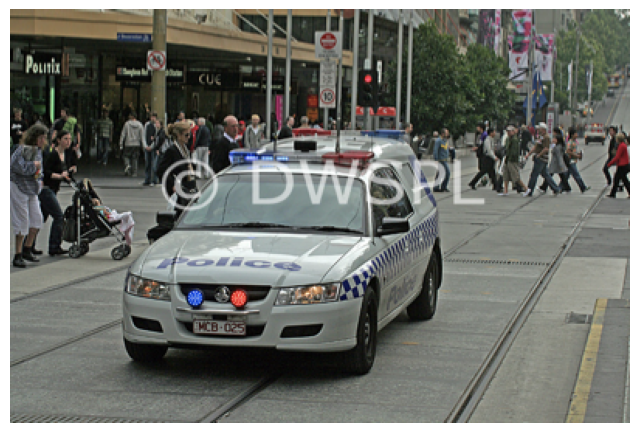

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars114.png: 384x640 5 number_plates, 73.8ms
Speed: 2.4ms preprocess, 73.8ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)


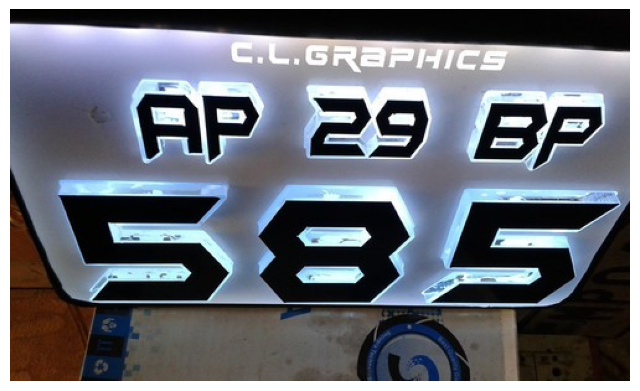

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars58.png: 416x640 3 number_plates, 72.0ms
Speed: 2.6ms preprocess, 72.0ms inference, 1.3ms postprocess per image at shape (1, 3, 416, 640)


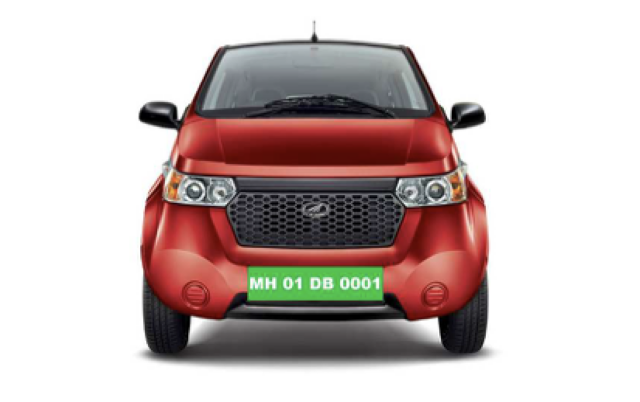

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars432.png: 416x640 2 number_plates, 12.0ms
Speed: 2.0ms preprocess, 12.0ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)


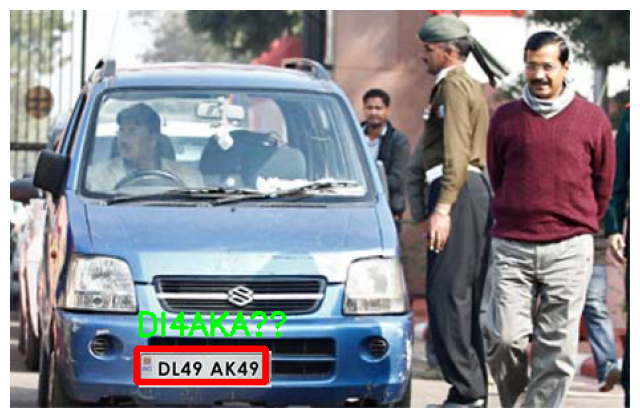

Plate 1: DI4AKA


image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars249.png: 416x640 6 number_plates, 12.1ms
Speed: 2.6ms preprocess, 12.1ms inference, 1.6ms postprocess per image at shape (1, 3, 416, 640)


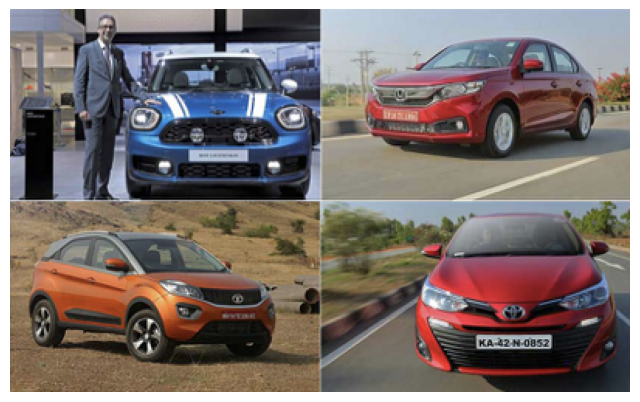

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars418.png: 384x640 1 number_plate, 12.8ms
Speed: 2.3ms preprocess, 12.8ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


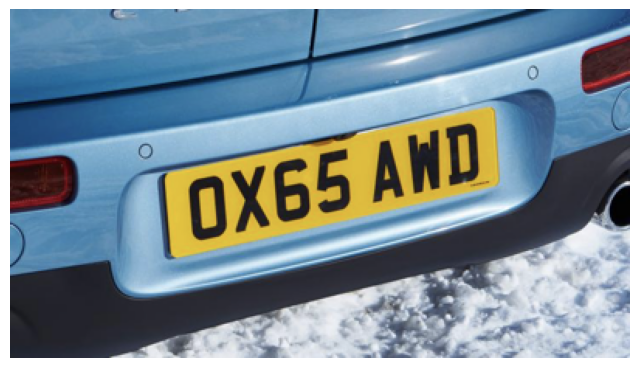

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars213.png: 480x640 1 number_plate, 89.5ms
Speed: 2.9ms preprocess, 89.5ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


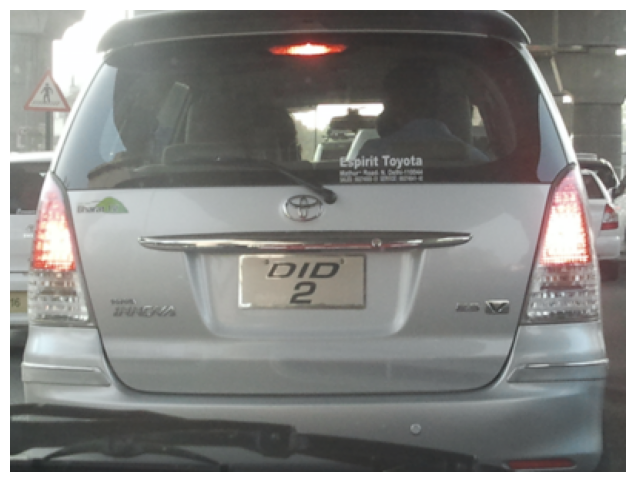

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars338.png: 448x640 (no detections), 13.2ms
Speed: 2.6ms preprocess, 13.2ms inference, 0.7ms postprocess per image at shape (1, 3, 448, 640)


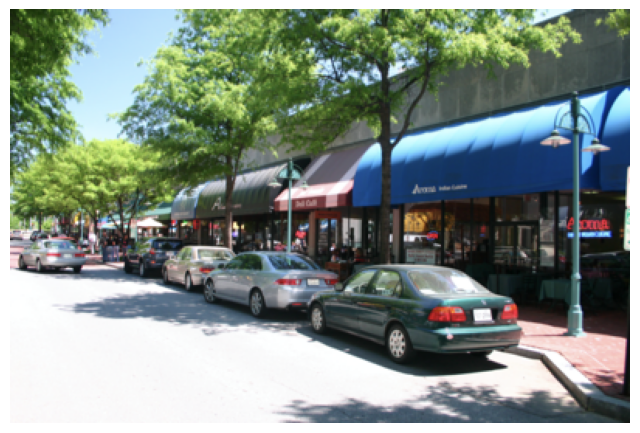

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/Cars63.png: 448x640 4 number_plates, 12.2ms
Speed: 2.7ms preprocess, 12.2ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


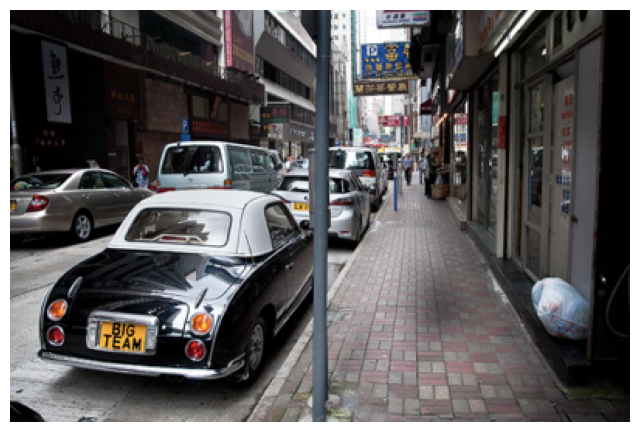

⚠️ No readable plate detected.

image 1/1 /content/drive/MyDrive/zenodo-license/license_plate/dataset/images/val/Cars150.png: 480x640 2 number_plates, 17.7ms
Speed: 5.1ms preprocess, 17.7ms inference, 2.4ms postprocess per image at shape (1, 3, 480, 640)


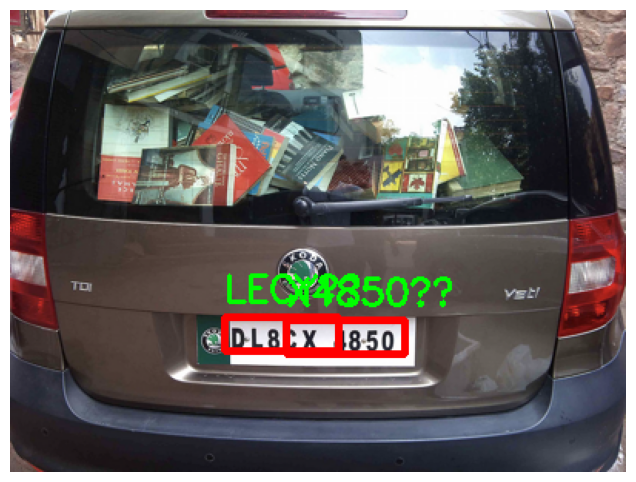

Plate 1: LECY

Plate 2: X4850



In [ ]:
import cv2
import random
import pytesseract
import matplotlib.pyplot as plt
from glob import glob
from ultralytics import YOLO
import os

# ---------- OCR Settings ----------
custom_config = r'--oem 3 --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'

# ---------- Load Model ----------
model = YOLO("runs/detect/train/weights/best.pt")

# ---------- TRY MULTIPLE IMAGE LOCATIONS ----------
search_paths = [
    "/content/drive/MyDrive/zenodo-license/images/*.jpg",
    "/content/drive/MyDrive/zenodo-license/images/*.png",
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/*.jpg",
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train/*.png",
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/val/*.jpg",
    "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/val/*.png",
]

image_paths = []
for p in search_paths:
    image_paths += glob(p)

print("🔍 Found", len(image_paths), "images")

if len(image_paths) == 0:
    raise FileNotFoundError("❌ Still no images found. Re-check Drive paths.")

# ---------- Pick Random Images ----------
num_images = min(10, len(image_paths))
random_images = random.sample(image_paths, num_images)

# ---------- Helper ----------
def format_plate(t):
    return t.upper().replace(" ", "").replace("-", "")

# ---------- PROCESS ----------
for img_path in random_images:

    img_bgr = cv2.imread(img_path)

    if img_bgr is None:
        print(f"⚠️ Could not read image: {img_path}")
        continue

    img_rgb = cv2.cvtColor(img_bgr, cv2.COLOR_BGR2RGB).copy()

    results = model(img_path, conf=0.4, iou=0.4)
    detected_texts = []

    for result in results:
        if not len(result.boxes):
            continue

        for box in result.boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)

            h_img, w_img, _ = img_bgr.shape
            x1, y1 = max(0, x1), max(0, y1)
            x2, y2 = min(w_img, x2), min(h_img, y2)

            plate = img_bgr[y1:y2, x1:x2]
            if plate.size == 0:
                continue

            gray = cv2.cvtColor(plate, cv2.COLOR_BGR2GRAY)

            # remove blue TR strip (10%)
            _, w = gray.shape
            gray = gray[:, int(w*0.10):]

            gray = cv2.GaussianBlur(gray, (5,5), 1)
            _, thresh = cv2.threshold(gray, 0, 255,
                                      cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            text = pytesseract.image_to_string(thresh, config=custom_config)
            text = format_plate(text)

            if len(text) >= 5:
                detected_texts.append(text)

                cv2.rectangle(img_rgb,(x1,y1),(x2,y2),(255,0,0),3)
                cv2.putText(img_rgb,text,(x1,y1-10),
                            cv2.FONT_HERSHEY_SIMPLEX,0.8,(0,255,0),2)

    # ---------- SHOW ----------
    plt.figure(figsize=(8,6))
    plt.imshow(img_rgb)
    plt.axis("off")
    plt.show()

    # ---------- PRINT ----------
    if detected_texts:
        for i,t in enumerate(detected_texts):
            print(f"Plate {i+1}: {t}")
    else:
        print("⚠️ No readable plate detected.")

In [ ]:
# Create a folder in Drive to store the weights (if not exist)
!mkdir -p /content/drive/MyDrive/output

# Copy trained weights FROM Colab TO Drive
!cp /content/runs/detect/train/weights/best.pt /content/drive/MyDrive/output/best.pt
!cp /content/runs/detect/train/weights/last.pt /content/drive/MyDrive/output/last.pt

print("✅ Model saved to Google Drive: /content/drive/MyDrive/output/")

✅ Model saved to Google Drive: /content/drive/MyDrive/output/


In [ ]:
!ls /content/runs/detect

train  train2  train3


In [ ]:
!cp /content/runs/detect/train2/weights/best.pt ...

cp: cannot stat '/content/runs/detect/train2/weights/best.pt': No such file or directory


In [ ]:
!ls -R /content/runs/detect

/content/runs/detect:
train  train2  train3

/content/runs/detect/train:
args.yaml			 confusion_matrix.png  train_batch2.jpg
BoxF1_curve.png			 labels.jpg	       val_batch0_labels.jpg
BoxP_curve.png			 results.csv	       val_batch0_pred.jpg
BoxPR_curve.png			 results.png	       weights
BoxR_curve.png			 train_batch0.jpg
confusion_matrix_normalized.png  train_batch1.jpg

/content/runs/detect/train/weights:
best.pt  last.pt

/content/runs/detect/train2:
args.yaml   train_batch0.jpg  train_batch2.jpg
labels.jpg  train_batch1.jpg  weights

/content/runs/detect/train2/weights:

/content/runs/detect/train3:
args.yaml			 confusion_matrix.png  train_batch2.jpg
BoxF1_curve.png			 labels.jpg	       val_batch0_labels.jpg
BoxP_curve.png			 results.csv	       val_batch0_pred.jpg
BoxPR_curve.png			 results.png	       weights
BoxR_curve.png			 train_batch0.jpg
confusion_matrix_normalized.png  train_batch1.jpg

/content/runs/detect/train3/weights:
best.pt  last.pt


In [ ]:
!ls /content/runs/detect/train3/weights

best.pt  last.pt


In [ ]:
!mkdir -p /content/drive/MyDrive/output

!cp /content/runs/detect/train3/weights/best.pt /content/drive/MyDrive/output/best.pt
!cp /content/runs/detect/train3/weights/last.pt /content/drive/MyDrive/output/last.pt

print("✅ Model copied to Google Drive/output/")

✅ Model copied to Google Drive/output/


In [ ]:
from google.colab import files
files.download('/content/drive/MyDrive/output/best.pt')

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

# **OCR Process begin**

In [ ]:
!pip install ultralytics opencv-python pytesseract matplotlib

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 17.8 MB/s eta 0:00:00


In [ ]:
!apt-get install -y tesseract-ocr-all

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-afr tesseract-ocr-amh tesseract-ocr-ara tesseract-ocr-asm
  tesseract-ocr-aze tesseract-ocr-aze-cyrl tesseract-ocr-bel tesseract-ocr-ben
  tesseract-ocr-bod tesseract-ocr-bos tesseract-ocr-bre tesseract-ocr-bul
  tesseract-ocr-cat tesseract-ocr-ceb tesseract-ocr-ces tesseract-ocr-chi-sim
  tesseract-ocr-chi-sim-vert tesseract-ocr-chi-tra tesseract-ocr-chi-tra-vert
  tesseract-ocr-chr tesseract-ocr-cos tesseract-ocr-cym tesseract-ocr-dan
  tesseract-ocr-deu tesseract-ocr-div tesseract-ocr-dzo tesseract-ocr-ell
  tesseract-ocr-enm tesseract-ocr-epo tesseract-ocr-est tesseract-ocr-eus
  tesseract-ocr-fao tesseract-ocr-fas tesseract-ocr-fil tesseract-ocr-fin
  tesseract-ocr-fra tesseract-ocr-frk tesseract-ocr-frm tesseract-ocr-fry
  tesseract-ocr-gla tesseract-ocr-gle tesseract-ocr-glg tesseract-ocr-grc
  tesseract-ocr-guj tes

In [ ]:
!pip uninstall -y paddleocr paddlex paddlepaddle paddlepaddle-gpu

Found existing installation: paddleocr 3.3.2
Uninstalling paddleocr-3.3.2:
  Successfully uninstalled paddleocr-3.3.2
Found existing installation: paddlex 3.3.12
Uninstalling paddlex-3.3.12:
  Successfully uninstalled paddlex-3.3.12


In [ ]:
!pip install paddlepaddle==2.6.2 paddleocr==2.7.0.3 ultralytics opencv-python shapely matplotlib

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 90.4/90.4 MB 10.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 125.9/125.9 MB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 465.7/465.7 kB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.5/65.5 kB 6.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 60.9/60.9 MB 13.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.9/115.9 kB 8.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.1/67.1 MB 11.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 46.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 299.4/299.4 kB 18.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 132.0/132.0 kB 10.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 253.0/253.0 kB 16.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.2/3.2 MB 85.4 MB/s eta 0:00:00


In [ ]:
# ========= CHANGE THESE =========
MODEL_PATH = "/content/drive/MyDrive/output/best.pt"
IMAGE_DIR = "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train"
# ================================

# Load YOLO
model = YOLO(MODEL_PATH)

# Load PaddleOCR  (don't call twice!)
ocr = PaddleOCR(lang='en', rec=True, det=True, use_gpu=False)

images = [f for f in os.listdir(IMAGE_DIR)
          if f.lower().endswith((".jpg",".jpeg",".png"))]

for img_name in images:

    img_path = os.path.join(IMAGE_DIR, img_name)
    img = cv2.imread(img_path)
    rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    results = model(rgb, conf=0.35)

    print(f"\n🔍 Image: {img_name}")
    found = False

    for r in results:
        if r.boxes is None:
            continue

        for box in r.boxes:
            x1, y1, x2, y2 = box.xyxy[0].cpu().numpy().astype(int)

            crop = rgb[y1:y2, x1:x2]
            if crop.size == 0:
                continue

            gray = cv2.cvtColor(crop, cv2.COLOR_RGB2GRAY)
            gray = cv2.bilateralFilter(gray, 9, 75, 75)

            result = ocr.ocr(gray, cls=False)

            text = ""
            if result and result[0]:
                for line in result[0]:
                    text += line[1][0]

            text = re.sub(r'[^A-Z0-9]', '', text.upper())

            if len(text) >= 4:
                found = True
                print(f"✅ Plate detected: {text}")
                cv2.rectangle(rgb,(x1,y1),(x2,y2),(0,255,0),3)
                cv2.putText(rgb,text,(x1,y1-10),
                            cv2.FONT_HERSHEY_SIMPLEX,0.9,(255,0,0),2)

    if not found:
        print("⚠️ No readable plate detected")

    plt.figure(figsize=(8,6))
    plt.imshow(rgb)
    plt.axis("off")
    plt.show()


RuntimeError: PDX has already been initialized. Reinitialization is not supported.

In [ ]:
!pip uninstall -y paddlex

Found existing installation: paddlex 3.3.12
Uninstalling paddlex-3.3.12:
  Successfully uninstalled paddlex-3.3.12


In [ ]:
!pip install -q ultralytics paddleocr shapely opencv-python matplotlib

In [ ]:
!pip list | grep paddle

paddleocr                                3.3.2
paddlex                                  3.3.12


In [ ]:
!pip install ultralytics paddleocr shapely opencv-python matplotlib


0: 416x640 2 number_plates, 741.5ms
Speed: 17.8ms preprocess, 741.5ms inference, 2.0ms postprocess per image at shape (1, 3, 416, 640)

🔍 IMAGE: Cars119.png
🚗 Plate: ERRORF   ❌ CHECK


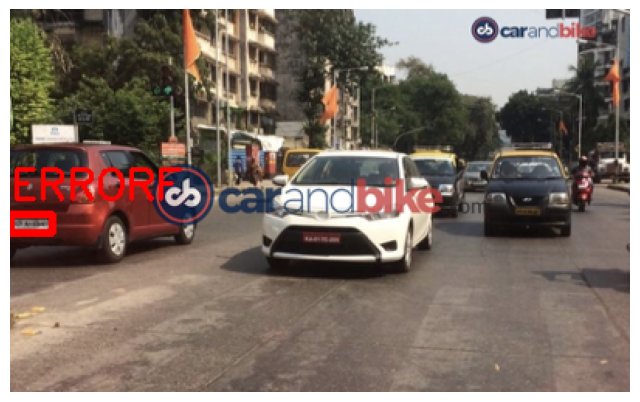


0: 448x640 1 number_plate, 517.3ms
Speed: 3.2ms preprocess, 517.3ms inference, 1.0ms postprocess per image at shape (1, 3, 448, 640)

🔍 IMAGE: Cars120.png
🚗 Plate: 4B2206HM   ❌ CHECK


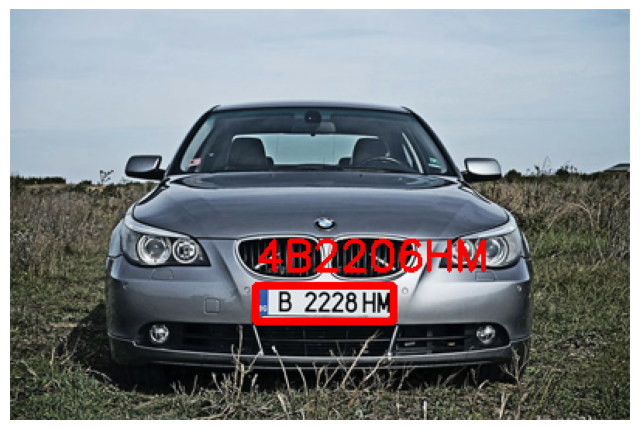


0: 448x640 3 number_plates, 460.4ms
Speed: 4.3ms preprocess, 460.4ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

🔍 IMAGE: Cars124.png
⚠ No readable plate found


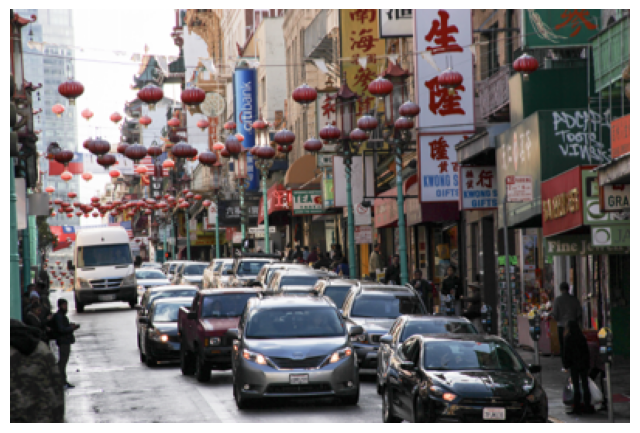


0: 416x640 4 number_plates, 749.5ms
Speed: 18.1ms preprocess, 749.5ms inference, 1.5ms postprocess per image at shape (1, 3, 416, 640)

🔍 IMAGE: Cars106.png
🚗 Plate: PCARUDIMATTY   ❌ CHECK
🚗 Plate: [RATETISTES)   ❌ CHECK


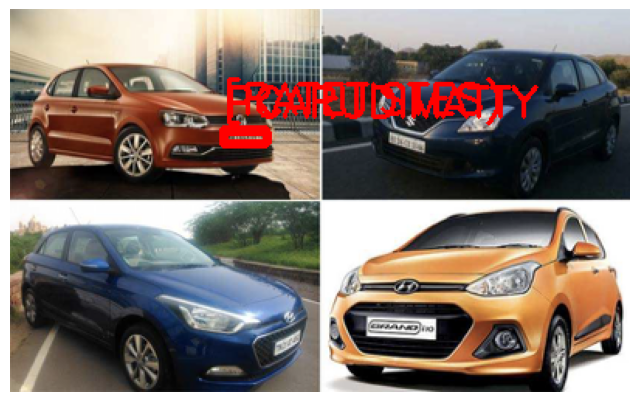


0: 352x640 1 number_plate, 432.4ms
Speed: 3.5ms preprocess, 432.4ms inference, 0.8ms postprocess per image at shape (1, 3, 352, 640)

🔍 IMAGE: Cars0.png
🚗 Plate: EGICA2SS5   ❌ CHECK


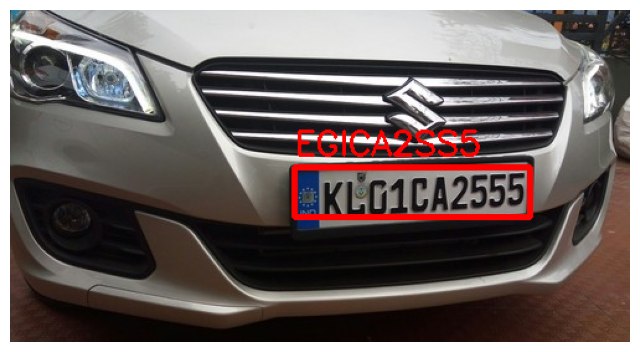


0: 480x640 2 number_plates, 550.0ms
Speed: 3.8ms preprocess, 550.0ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

🔍 IMAGE: Cars121.png
⚠ No readable plate found


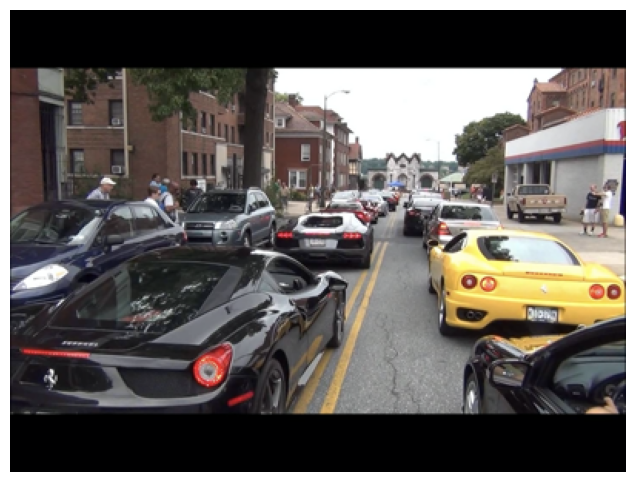


0: 448x640 1 number_plate, 473.3ms
Speed: 4.2ms preprocess, 473.3ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

🔍 IMAGE: Cars127.png
⚠ No readable plate found


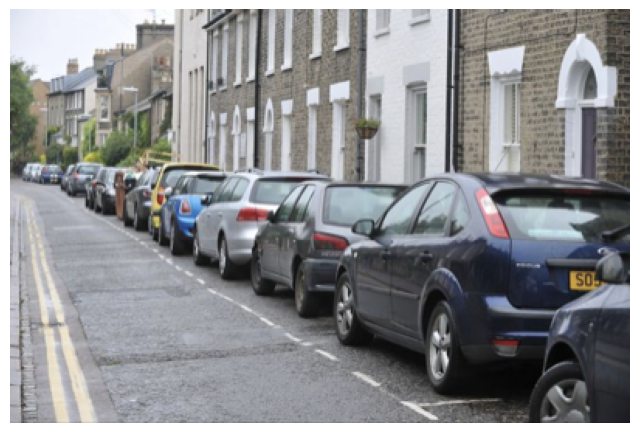


0: 384x640 1 number_plate, 618.3ms
Speed: 5.8ms preprocess, 618.3ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

🔍 IMAGE: Cars107.png
⚠ No readable plate found


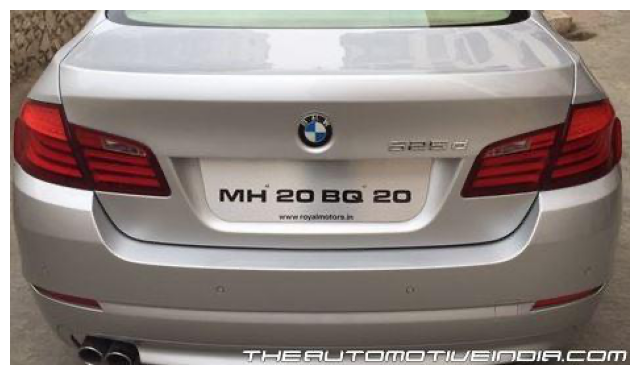


0: 320x640 2 number_plates, 494.7ms
Speed: 2.6ms preprocess, 494.7ms inference, 1.2ms postprocess per image at shape (1, 3, 320, 640)

🔍 IMAGE: Cars117.png
🚗 Plate: [OYJENSIEK   ❌ CHECK


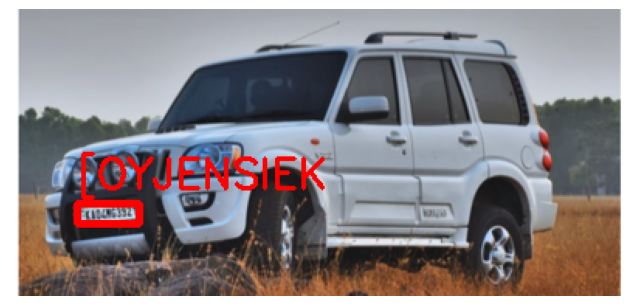


0: 448x640 1 number_plate, 854.1ms
Speed: 3.8ms preprocess, 854.1ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)

🔍 IMAGE: Cars100.png
🚗 Plate: UHNF2S56   ❌ CHECK


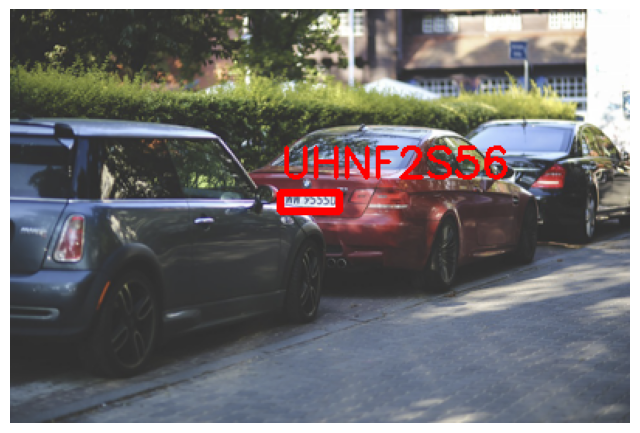


0: 512x640 1 number_plate, 768.0ms
Speed: 5.7ms preprocess, 768.0ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)

🔍 IMAGE: Cars108.png
🚗 Plate: SMHOTARESS   ❌ CHECK


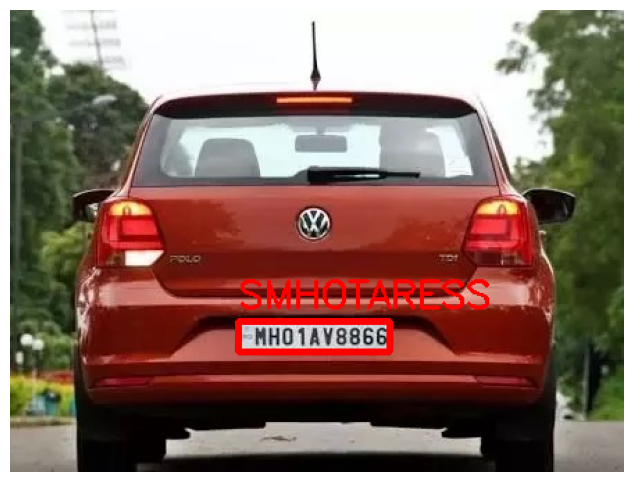


0: 256x640 1 number_plate, 362.8ms
Speed: 2.5ms preprocess, 362.8ms inference, 0.9ms postprocess per image at shape (1, 3, 256, 640)

🔍 IMAGE: Cars12.png
🚗 Plate: HH1Z20672501   ❌ CHECK


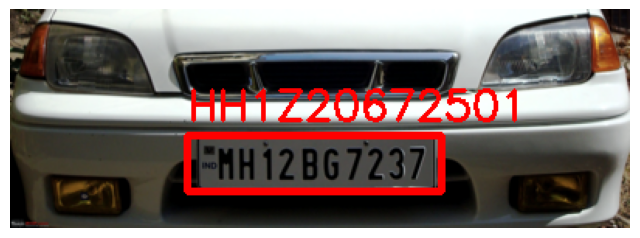


0: 512x640 1 number_plate, 700.4ms
Speed: 4.1ms preprocess, 700.4ms inference, 0.9ms postprocess per image at shape (1, 3, 512, 640)

🔍 IMAGE: Cars102.png
⚠ No readable plate found


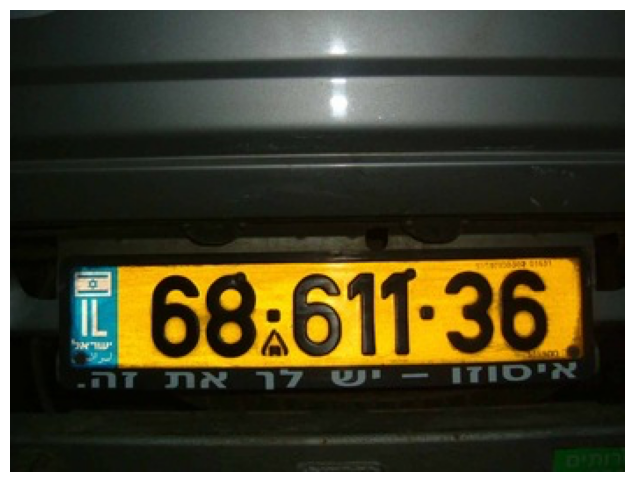


0: 384x640 1 number_plate, 470.3ms
Speed: 5.3ms preprocess, 470.3ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

🔍 IMAGE: Cars111.png
🚗 Plate: ENER7598   ❌ CHECK


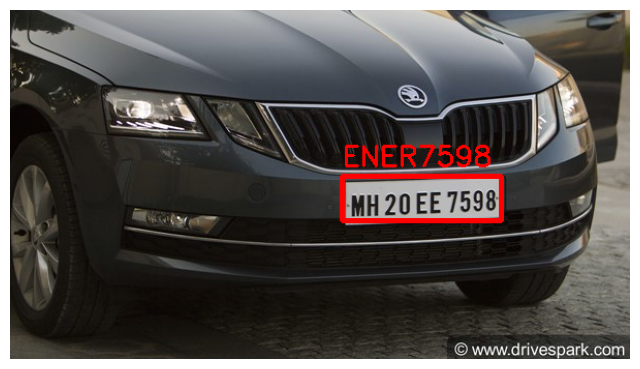


0: 480x640 1 number_plate, 559.3ms
Speed: 4.7ms preprocess, 559.3ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

🔍 IMAGE: Cars123.png
⚠ No readable plate found


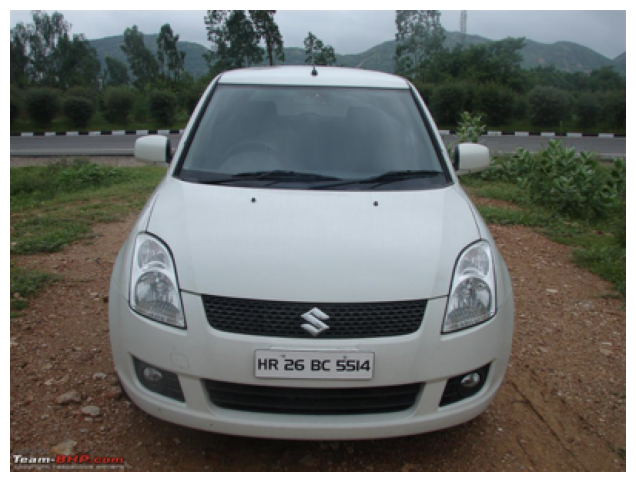


0: 448x640 2 number_plates, 530.3ms
Speed: 6.1ms preprocess, 530.3ms inference, 1.1ms postprocess per image at shape (1, 3, 448, 640)

🔍 IMAGE: Cars110.png
⚠ No readable plate found


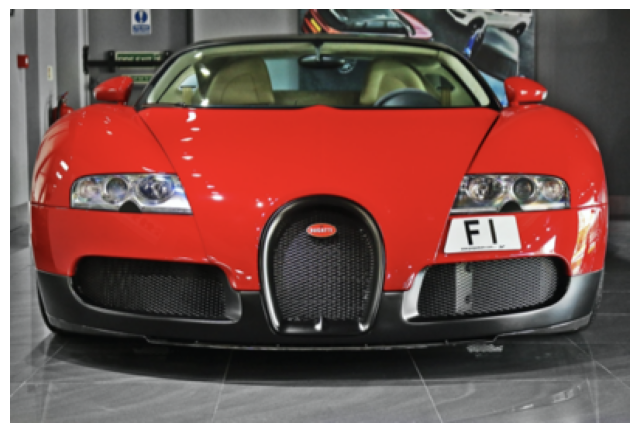


0: 480x640 1 number_plate, 591.2ms
Speed: 3.7ms preprocess, 591.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

🔍 IMAGE: Cars101.png
🚗 Plate: IHR26BCS4   ❌ CHECK


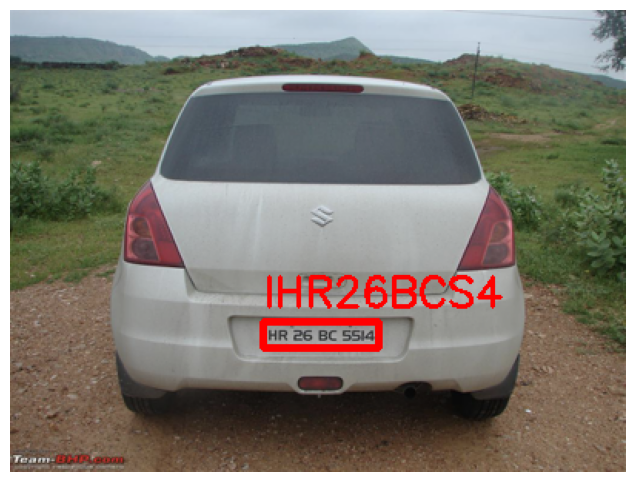


0: 416x640 1 number_plate, 664.9ms
Speed: 3.5ms preprocess, 664.9ms inference, 0.9ms postprocess per image at shape (1, 3, 416, 640)

🔍 IMAGE: Cars1.png
🚗 Plate: SPGOHNI12   ❌ CHECK


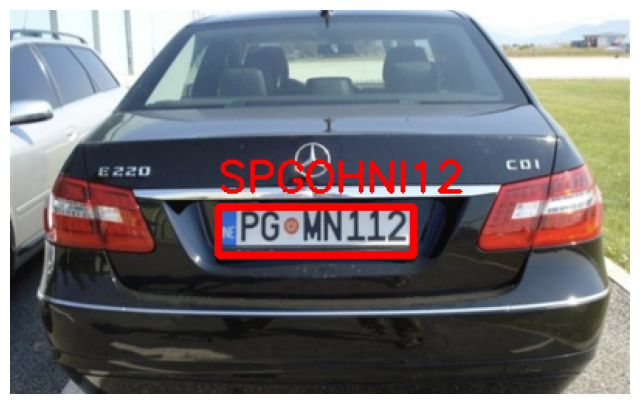


0: 480x640 1 number_plate, 606.8ms
Speed: 4.1ms preprocess, 606.8ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)

🔍 IMAGE: Cars122.png
🚗 Plate: THANISAL   ❌ CHECK


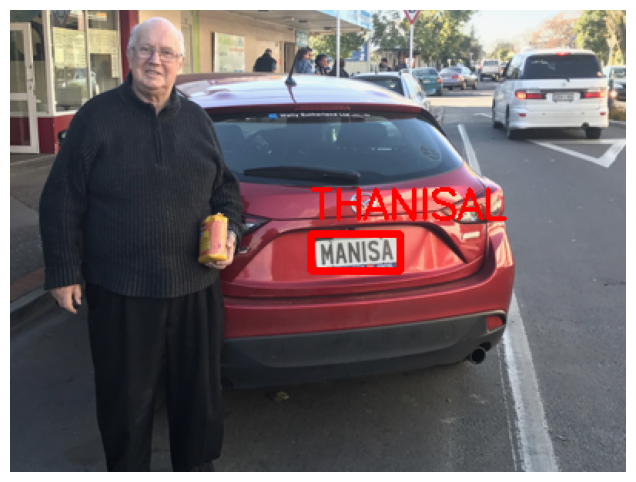


0: 384x640 (no detections), 583.5ms
Speed: 5.3ms preprocess, 583.5ms inference, 0.9ms postprocess per image at shape (1, 3, 384, 640)

🔍 IMAGE: Cars128.png
⚠ No readable plate found


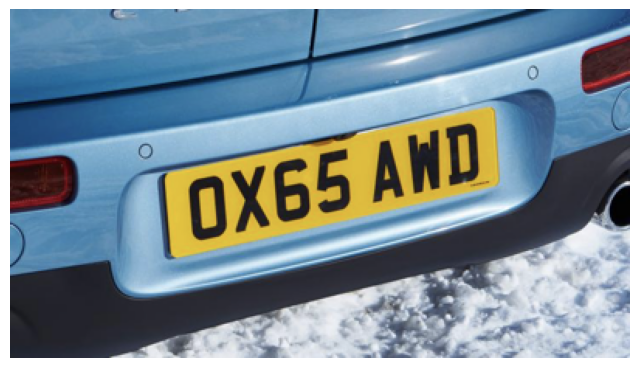


0: 416x640 1 number_plate, 638.1ms
Speed: 5.8ms preprocess, 638.1ms inference, 1.2ms postprocess per image at shape (1, 3, 416, 640)

🔍 IMAGE: Cars118.png
🚗 Plate: JAGZUAR   ❌ CHECK


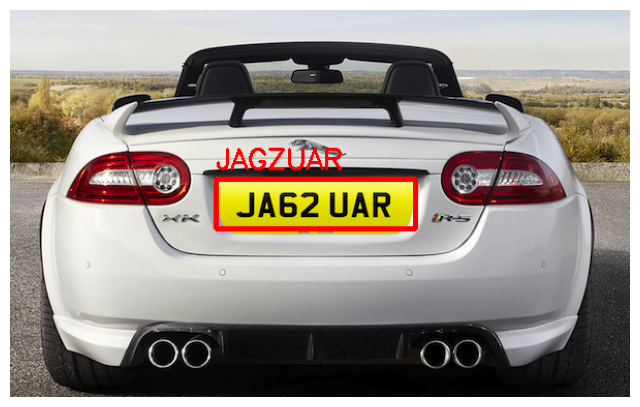


0: 512x640 1 number_plate, 904.3ms
Speed: 7.2ms preprocess, 904.3ms inference, 1.5ms postprocess per image at shape (1, 3, 512, 640)

🔍 IMAGE: Cars129.png
🚗 Plate: OPECTOL   ❌ CHECK


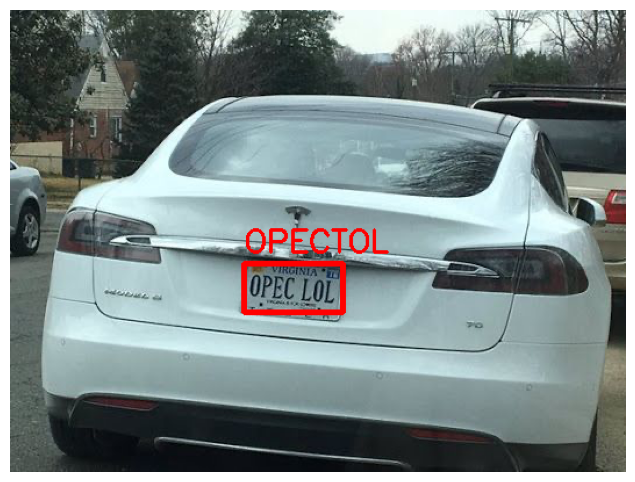


0: 384x640 (no detections), 604.8ms
Speed: 6.2ms preprocess, 604.8ms inference, 0.7ms postprocess per image at shape (1, 3, 384, 640)

🔍 IMAGE: Cars10.png
⚠ No readable plate found


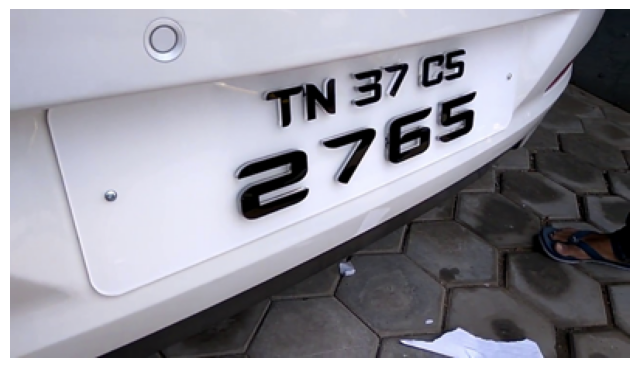


0: 384x640 1 number_plate, 591.9ms
Speed: 3.2ms preprocess, 591.9ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

🔍 IMAGE: Cars114.png
⚠ No readable plate found


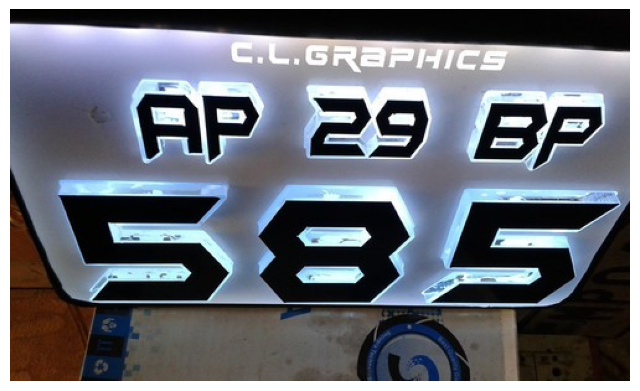


0: 512x640 1 number_plate, 920.3ms
Speed: 7.4ms preprocess, 920.3ms inference, 1.7ms postprocess per image at shape (1, 3, 512, 640)

🔍 IMAGE: Cars115.png
⚠ No readable plate found


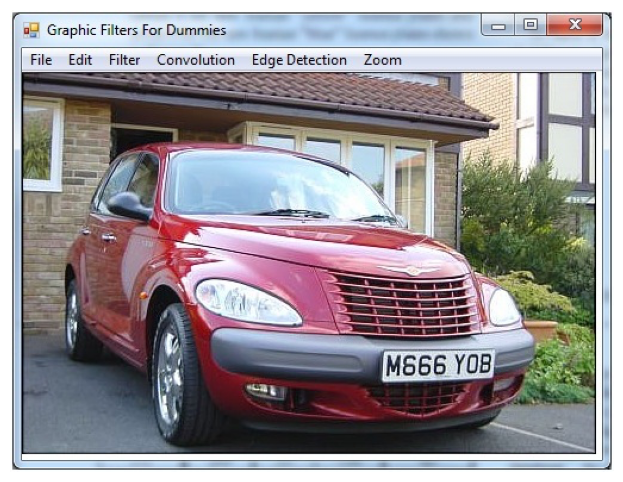


0: 384x640 4 number_plates, 592.6ms
Speed: 5.2ms preprocess, 592.6ms inference, 1.1ms postprocess per image at shape (1, 3, 384, 640)

🔍 IMAGE: Cars105.png
🚗 Plate: BTETEY   ❌ CHECK


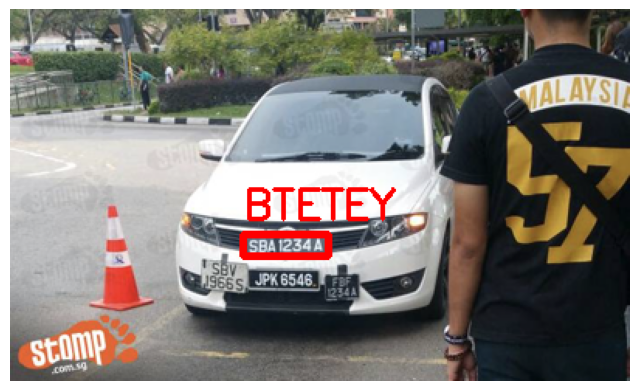


0: 448x640 1 number_plate, 598.5ms
Speed: 3.7ms preprocess, 598.5ms inference, 0.9ms postprocess per image at shape (1, 3, 448, 640)

🔍 IMAGE: Cars109.png
🚗 Plate: MC7I7KOD   ❌ CHECK


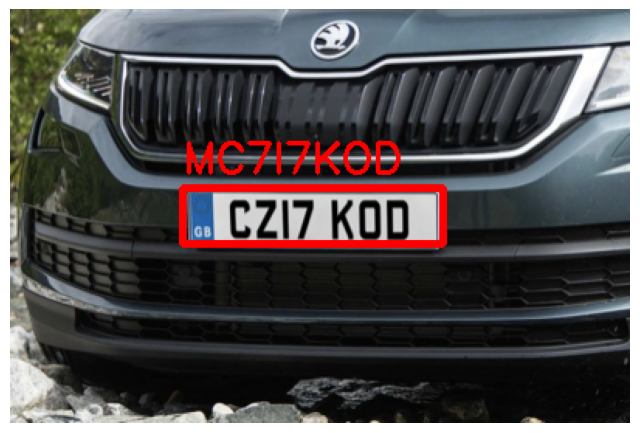


0: 320x640 (no detections), 462.0ms
Speed: 5.1ms preprocess, 462.0ms inference, 0.7ms postprocess per image at shape (1, 3, 320, 640)

🔍 IMAGE: Cars103.png
⚠ No readable plate found


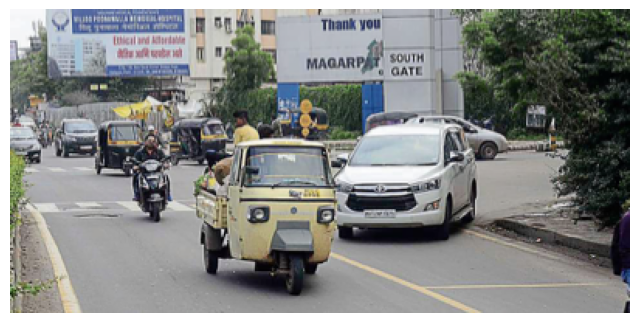


0: 480x640 1 number_plate, 729.8ms
Speed: 4.3ms preprocess, 729.8ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

🔍 IMAGE: Cars113.png
🚗 Plate: WASHINGTON,11   ❌ CHECK


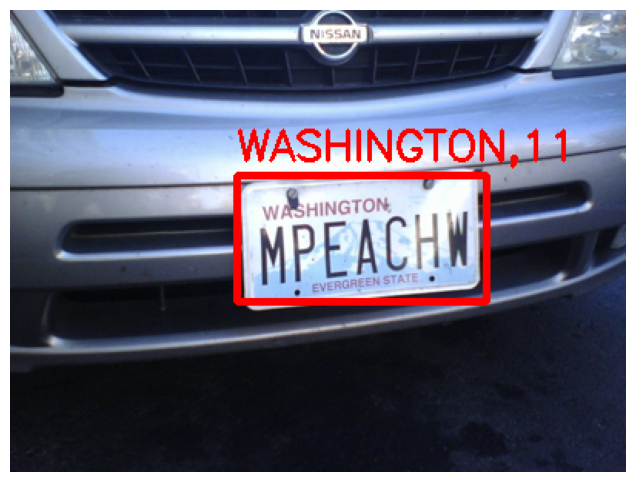

KeyboardInterrupt: 

In [ ]:
import cv2
import pytesseract
import re
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt
import os
from datetime import datetime

# ================== CHANGE THESE ==================
MODEL_PATH = "/content/drive/MyDrive/output/best.pt"
IMAGE_DIR = "/content/drive/MyDrive/zenodo-license/license_plate/dataset/images/train"
SAVE_PLATES_DIR = "/content/drive/MyDrive/LicensePlate/cropped_plates"
# ==================================================

os.makedirs(SAVE_PLATES_DIR, exist_ok=True)

# YOLO Model
model = YOLO(MODEL_PATH)

# OCR config - strict char whitelist
ocr_cfg = r'--oem 3 --psm 7 -c tessedit_char_whitelist=ABCDEFGHIJKLMNOPQRSTUVWXYZ0123456789'


# ============= Regex for Indian Plates =================
plate_regex = re.compile(r'^[A-Z]{2}\d{1,2}[A-Z]{1,2}\d{3,4}$')
# ======================================================


def clean_text(t):
    return (
        t.upper()
         .replace(" ", "")
         .replace("-", "")
         .replace("\n", "")
         .strip()
    )


def preprocess_plate(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # adaptive contrast
    gray = cv2.equalizeHist(gray)

    # denoise
    gray = cv2.bilateralFilter(gray, 11, 17, 17)

    # sharpen
    kernel = np.array([[0,-1,0],[-1,5,-1],[0,-1,0]])
    gray = cv2.filter2D(gray, -1, kernel)

    # binarize
    _,th = cv2.threshold(gray,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)

    return th


def is_valid_plate(text):
    return bool(plate_regex.match(text))


# ============== Process All Images =====================
images = [f for f in os.listdir(IMAGE_DIR) if f.lower().endswith((".jpg",".jpeg",".png"))]

for img_name in images:

    img_path = os.path.join(IMAGE_DIR, img_name)
    img = cv2.imread(img_path)
    draw = img.copy()

    results = model(img, conf=0.35)

    print(f"\n🔍 IMAGE: {img_name}")

    detected_any = False

    for r in results:
        if r.boxes is None: continue

        for box in r.boxes:
            x1,y1,x2,y2 = map(int, box.xyxy[0])
            plate = img[y1:y2, x1:x2]

            if plate.size == 0: continue

            processed = preprocess_plate(plate)

            text = pytesseract.image_to_string(processed, config=ocr_cfg)
            text = clean_text(text)

            # Try again with different PSM if short
            if len(text) < 6:
                text2 = pytesseract.image_to_string(processed, config='--oem 3 --psm 6')
                text2 = clean_text(text2)
                if len(text2) > len(text):
                    text = text2

            # Filter invalid
            if len(text) >= 6:

                detected_any = True

                valid = is_valid_plate(text)

                # Draw bounding box
                color = (0,255,0) if valid else (0,0,255)
                cv2.rectangle(draw,(x1,y1),(x2,y2),color,3)
                cv2.putText(draw,text,(x1,y1-10),cv2.FONT_HERSHEY_SIMPLEX,0.9,color,2)

                print(f"🚗 Plate: {text}   {'✔ VALID' if valid else '❌ CHECK'}")

                # Save cropped plate
                save_name = f"{datetime.now().strftime('%H%M%S')}_{text}.png"
                cv2.imwrite(os.path.join(SAVE_PLATES_DIR, save_name), plate)

    if not detected_any:
        print("⚠ No readable plate found")

    # Show result
    plt.figure(figsize=(8,6))
    plt.imshow(cv2.cvtColor(draw, cv2.COLOR_BGR2RGB))
    plt.axis("off")
    plt.show()


In [ ]:
!pip install ultralytics easyocr opencv-python

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.9/2.9 MB 29.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 180.7/180.7 kB 11.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 978.2/978.2 kB 46.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 300.6/300.6 kB 18.5 MB/s eta 0:00:00


In [ ]:
from google.colab.output import eval_js
from base64 import b64decode

In [ ]:
cap = cv2.VideoCapture(0, cv2.CAP_DSHOW)

In [ ]:
!pip install ultralytics easyocr opencv-python

import cv2
import numpy as np
from base64 import b64decode
from google.colab.output import eval_js
from IPython.display import display, Javascript
from ultralytics import YOLO
import easyocr
import torch


In [ ]:
display(Javascript("""
var video;
var stream;

async function setupCamera() {
  if (!navigator.mediaDevices || !navigator.mediaDevices.getUserMedia) {
    alert('Webcam not supported in this browser 😢');
    return;
  }

  video = document.createElement('video');
  document.body.appendChild(video);

  stream = await navigator.mediaDevices.getUserMedia({video: true});
  video.srcObject = stream;

  await video.play();
  return true;
}

async function captureFrame() {
  if (!video) {
    await setupCamera();
  }

  var canvas = document.createElement('canvas');
  canvas.width = video.videoWidth;
  canvas.height = video.videoHeight;

  var ctx = canvas.getContext('2d');
  ctx.drawImage(video, 0, 0);

  return canvas.toDataURL('image/jpeg', 0.9);
}
"""))


<IPython.core.display.Javascript object>

In [ ]:
def get_frame():
    data = eval_js('captureFrame()')
    binary = b64decode(data.split(',')[1])
    jpg = np.frombuffer(binary, dtype=np.uint8)
    return cv2.imdecode(jpg, cv2.IMREAD_COLOR)


In [ ]:
model = YOLO("/content/drive/MyDrive/output/best.pt")   # ⚠️ change path if needed
reader = easyocr.Reader(['en'], gpu=torch.cuda.is_available())

In [ ]:
from google.colab.patches import cv2_imshow

for _ in range(200):  # run fixed iterations so it doesn't lock
    frame = get_frame()

    results = model(frame)

    for r in results:
        for box in r.boxes.xyxy.cpu().numpy().astype(int):
            x1,y1,x2,y2 = box
            roi = frame[y1:y2, x1:x2]

            text = " ".join(reader.readtext(roi, detail=0))

            cv2.rectangle(frame,(x1,y1),(x2,y2),(0,255,0),2)
            cv2.putText(frame,text,(x1,y1-10),
                        cv2.FONT_HERSHEY_SIMPLEX,0.7,(0,255,0),2)

    cv2_imshow(cv2.cvtColor(frame, cv2.COLOR_BGR2RGB))


MessageError: ReferenceError: captureFrame is not defined

In [ ]:
import cv2
from ultralytics import YOLO
import easyocr
import torch

# ---- Load Model ----
model = YOLO("/content/drive/MyDrive/output/best.pt")   # << replace with your model path

# ---- OCR Reader ----
reader = easyocr.Reader(["en"], gpu=torch.cuda.is_available())

# ---- Webcam ----
cap = cv2.VideoCapture(0)   # 0 = default webcam

if not cap.isOpened():
    print("Webcam not detected 😢")
    raise SystemExit

print("Webcam OCR Started... Press Q to quit.")

while True:
    ret, frame = cap.read()
    if not ret:
        break

    results = model(frame)

    for r in results:
        boxes = r.boxes.xyxy.cpu().numpy().astype(int)
        confs = r.boxes.conf.cpu().numpy()

        for box, conf in zip(boxes, confs):
            x1,y1,x2,y2 = box

            # crop detected region
            roi = frame[y1:y2, x1:x2]

            # OCR
            ocr_result = reader.readtext(roi, detail=0)

            text = " ".join(ocr_result)

            # Draw box
            cv2.rectangle(frame,(x1,y1),(x2,y2),(0,255,0),2)
            cv2.putText(frame,f"{text} ({conf:.2f})",(x1,y1-10),
                        cv2.FONT_HERSHEY_SIMPLEX,0.6,(0,255,0),2)

    cv2.imshow("Webcam OCR", frame)

    if cv2.waitKey(1) & 0xFF == ord('q'):
        break

cap.release()
cv2.destroyAllWindows()

Webcam not detected 😢


SystemExit: 